In [1]:
# change kernel to widget
import xarray as xr
import rioxarray as rxr
from rioxarray.merge import merge_arrays
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from pathlib import Path
%matplotlib widget

In [2]:
# load data
ds = xr.open_dataset('ncqs_hourly_pertransect.nc')  

In [4]:
# perpare landsat mosaic
IMG_DIR = Path("imagery")

red_files = [IMG_DIR / f for f in [
    'LC08_L2SP_014035_20170409_20200904_02_T1_SR_B4.TIF',
    'LC08_L2SP_014036_20170409_20200904_02_T1_SR_B4.TIF',
    'LC08_L2SP_015036_20170502_20200904_02_T1_SR_B4.TIF',
    'LC08_L2SP_014036_20170527_20200903_02_T1_SR_B4.TIF',
]]

green_files = [IMG_DIR / f for f in [
    'LC08_L2SP_014035_20170409_20200904_02_T1_SR_B3.TIF',
    'LC08_L2SP_014035_20170409_20200904_02_T1_SR_B3.TIF',
    'LC08_L2SP_015036_20170502_20200904_02_T1_SR_B3.TIF',
    'LC08_L2SP_014036_20170527_20200903_02_T1_SR_B3.TIF',
]]

blue_files = [IMG_DIR / f for f in [
    'LC08_L2SP_014035_20170409_20200904_02_T1_SR_B2.TIF',
    'LC08_L2SP_014036_20170409_20200904_02_T1_SR_B2.TIF',
    'LC08_L2SP_015036_20170502_20200904_02_T1_SR_B2.TIF',
    'LC08_L2SP_014036_20170527_20200903_02_T1_SR_B2.TIF',
]]

def mosaic_band(file_list):
    """Opens a list of TIFs and merges them into one array."""
    elements = [rxr.open_rasterio(f, masked=True).squeeze() for f in file_list]
    return merge_arrays(elements)

print("Mosaicking bands... ")
merged_red = mosaic_band(red_files)
merged_green = mosaic_band(green_files)
merged_blue = mosaic_band(blue_files)

rgb = xr.concat([merged_red, merged_green, merged_blue], dim='band')
rgb['band'] = [1, 2, 3]

rgb_scaled = (rgb / 20000).clip(0, 1)
print('Done! :)')

Mosaicking bands... 
Done! :)


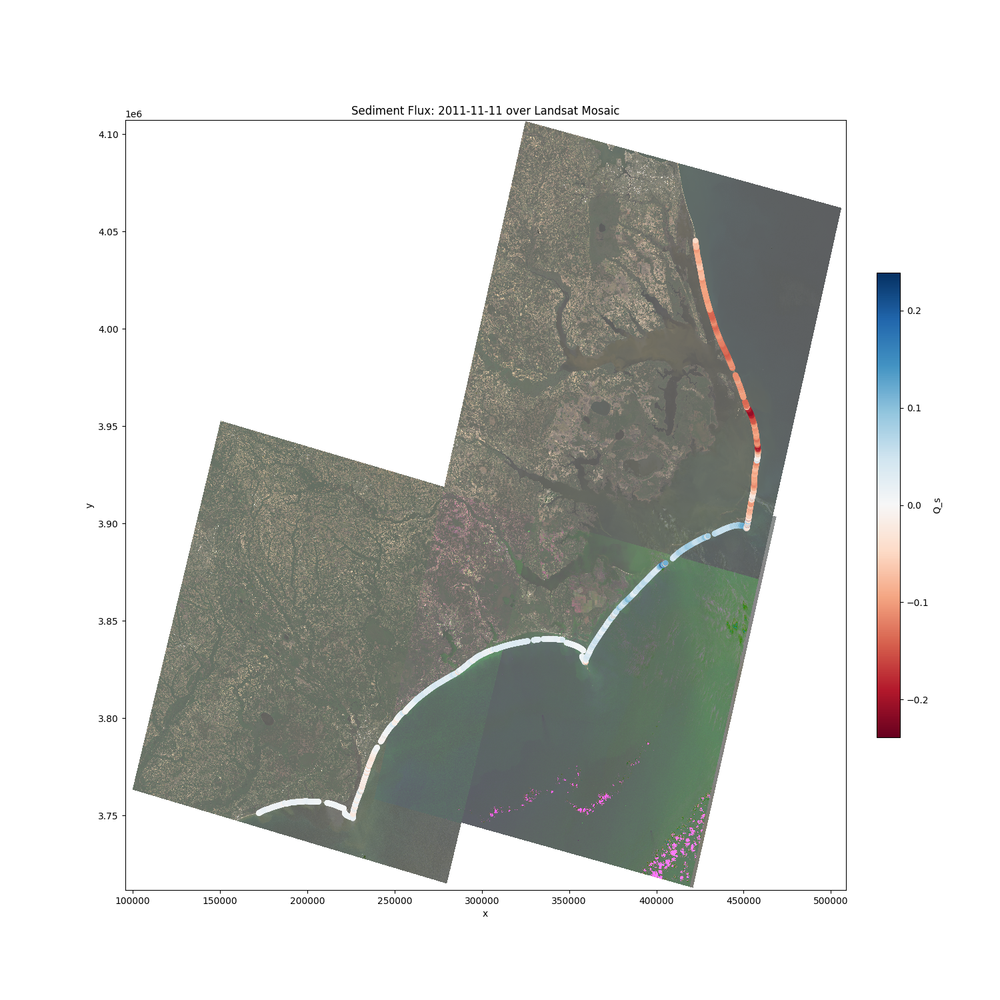

In [4]:
# plot for one time value
target_date = "2011-11-11"
snapshot = ds['qs'].sel(time=target_date, method='nearest').squeeze()
lon = ds['lon']
lat = ds['lat']


gdf = gpd.GeoDataFrame(
    {'qs': snapshot.values},
    geometry=gpd.points_from_xy(lon, lat),
    crs="EPSG:4326"
)
gdf = gdf.to_crs(rgb.rio.crs)

fig, ax = plt.subplots(figsize=(15, 15))

rgb_scaled.plot.imshow(rgb='band', ax=ax)

limit = max(abs(np.nanmax(snapshot.values)), abs(np.nanmin(snapshot.values)))
scatter = ax.scatter(
    gdf.geometry.x, 
    gdf.geometry.y, 
    c=gdf['qs'],
    vmin=-limit, vmax=limit,
    cmap='RdBu', 
    s=25
)

plt.colorbar(scatter, label='Q_s', fraction=0.03, pad=0.04)
plt.title(f"Sediment Flux: {target_date} over Landsat Mosaic")
# ax.set_axis_off() # hides UTM coordinates
plt.show()

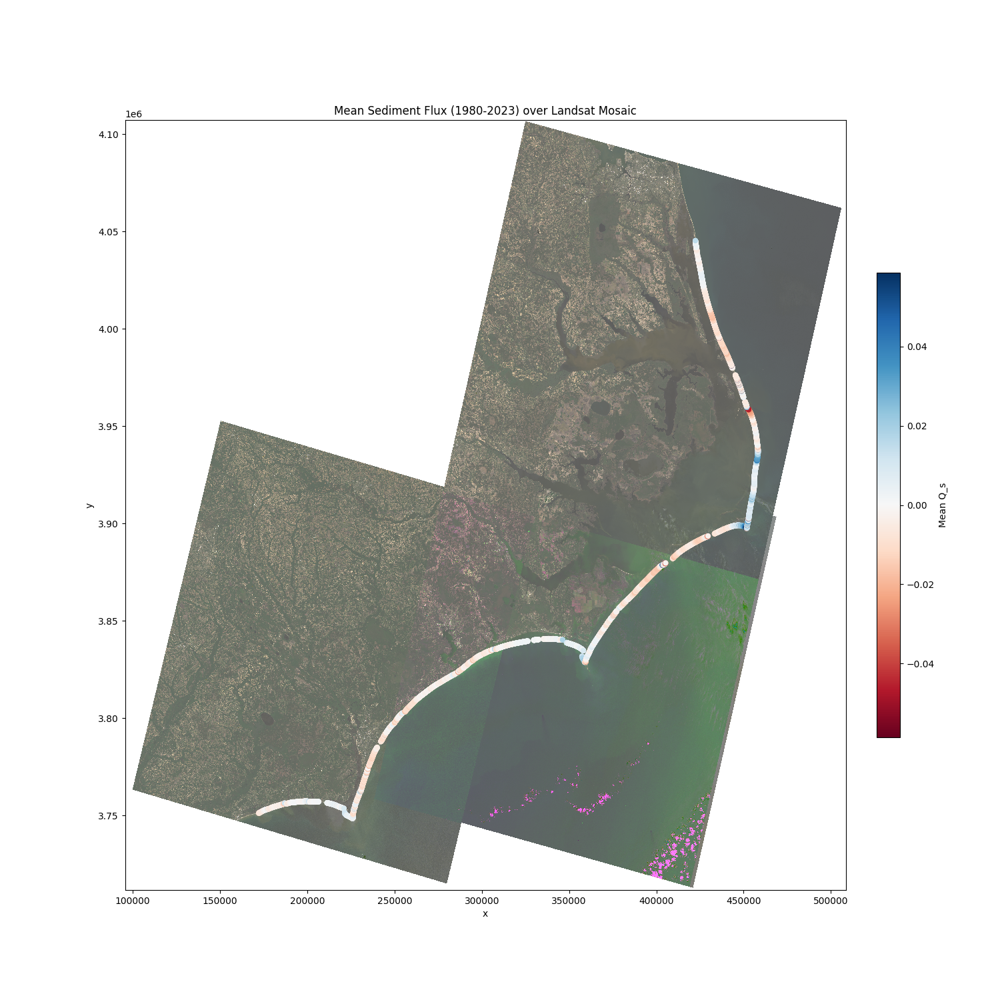

In [5]:
mean_transport = ds['qs'].mean(dim='time').compute()
mean_lon = ds['lon']
mean_lat = ds['lat']

gdf = gpd.GeoDataFrame(
    {'qs': mean_transport.values},
    geometry=gpd.points_from_xy(mean_lon, mean_lat),
    crs="EPSG:4326"
)
gdf = gdf.to_crs(rgb.rio.crs)

fig, ax = plt.subplots(figsize=(15, 15))

rgb_scaled.plot.imshow(rgb='band', ax=ax)

limit = max(abs(np.nanmax(mean_transport)), abs(np.nanmin(mean_transport)))
scatter = ax.scatter(
    gdf.geometry.x, 
    gdf.geometry.y, 
    c=gdf['qs'],
    vmin=-limit, vmax=limit,
    cmap='RdBu', 
    s=25
)

plt.colorbar(scatter, label='Mean Q_s', fraction=0.03, pad=0.04)
plt.title(f"Mean Sediment Flux (1980-2023) over Landsat Mosaic")
# ax.set_axis_off() # hides UTM coordinates
plt.show()

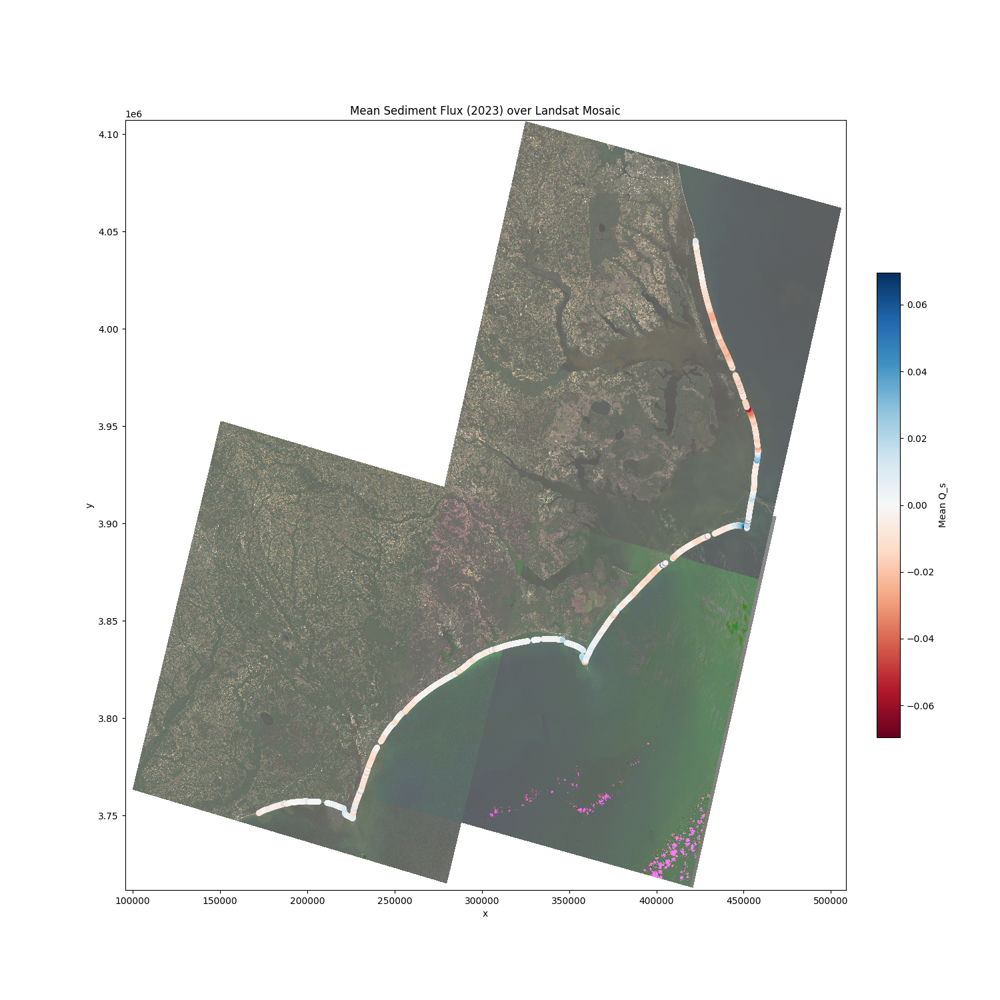

In [6]:
# average per year
target_year = '2023' 

mean_transport = ds['qs'].sel(time=target_year).mean(dim='time').compute()

mean_lon = ds['lon']
mean_lat = ds['lat']

gdf = gpd.GeoDataFrame(
    {'qs': mean_transport.values},
    geometry=gpd.points_from_xy(mean_lon, mean_lat),
    crs="EPSG:4326"
)
gdf = gdf.to_crs(rgb.rio.crs)

fig, ax = plt.subplots(figsize=(15, 15))

rgb_scaled.plot.imshow(rgb='band', ax=ax)

limit = max(abs(np.nanmax(mean_transport)), abs(np.nanmin(mean_transport)))

scatter = ax.scatter(
    gdf.geometry.x, 
    gdf.geometry.y, 
    c=gdf['qs'],
    vmin=-limit, vmax=limit,
    cmap='RdBu', 
    s=25
)

plt.colorbar(scatter, label='Mean Q_s', fraction=0.03, pad=0.04)
plt.title(f"Mean Sediment Flux ({target_year}) over Landsat Mosaic")
# ax.set_axis_off() # hides UTM coordinates
plt.show()

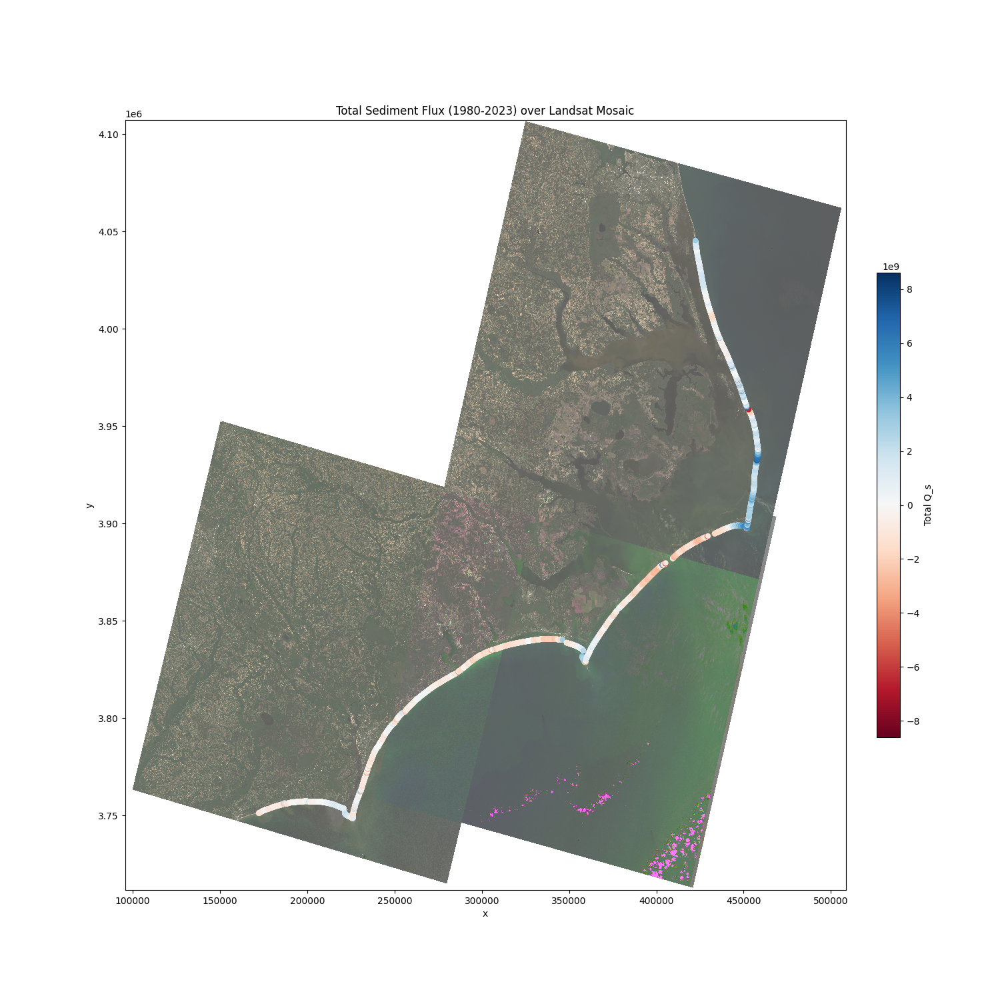

In [5]:
sum_transport = ds['qs'].sum(dim='time').compute()*385714
mean_lon = ds['lon']
mean_lat = ds['lat']

gdf = gpd.GeoDataFrame(
    {'qs': sum_transport.values},
    geometry=gpd.points_from_xy(mean_lon, mean_lat),
    crs="EPSG:4326"
)
gdf = gdf.to_crs(rgb.rio.crs)

fig, ax = plt.subplots(figsize=(15, 15))

rgb_scaled.plot.imshow(rgb='band', ax=ax)

limit = max(abs(np.nanmax(sum_transport)), abs(np.nanmin(sum_transport)))
scatter = ax.scatter(
    gdf.geometry.x, 
    gdf.geometry.y, 
    c=gdf['qs'],
    vmin=-limit, vmax=limit,
    cmap='RdBu', 
    s=25
)

plt.colorbar(scatter, label='Total Q_s', fraction=0.03, pad=0.04)
plt.title(f"Total Sediment Flux (1980-2023) over Landsat Mosaic")
# ax.set_axis_off() # hides UTM coordinates
plt.show()

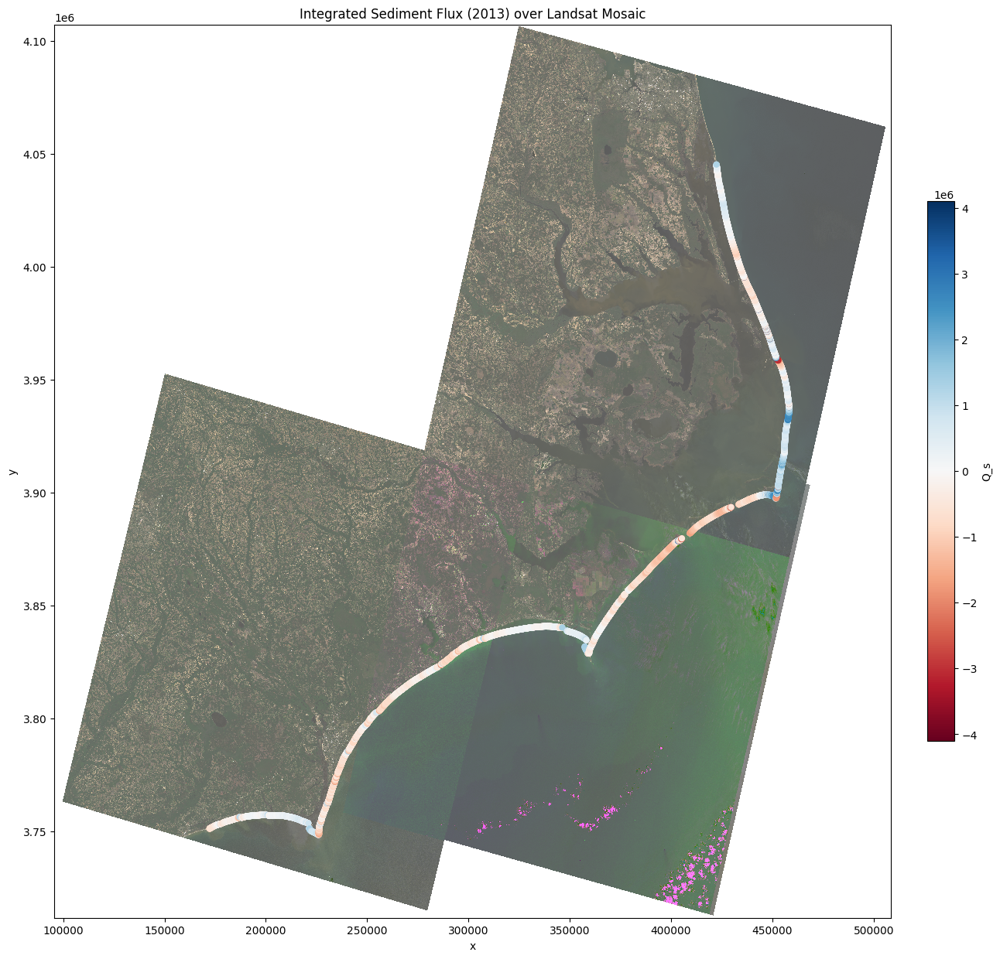

In [10]:
# average per year
target_year = '2013' 

int_transport = (ds['qs'].sel(time=target_year).sum(dim='time').compute())*8760

mean_lon = ds['lon']
mean_lat = ds['lat']

gdf = gpd.GeoDataFrame(
    {'qs': int_transport.values},
    geometry=gpd.points_from_xy(mean_lon, mean_lat),
    crs="EPSG:4326"
)
gdf = gdf.to_crs(rgb.rio.crs)

fig, ax = plt.subplots(figsize=(15, 15))

rgb_scaled.plot.imshow(rgb='band', ax=ax)

limit = max(abs(np.nanmax(int_transport)), abs(np.nanmin(int_transport)))

scatter = ax.scatter(
    gdf.geometry.x, 
    gdf.geometry.y, 
    c=gdf['qs'],
    vmin=-limit, vmax=limit,
    cmap='RdBu', 
    s=25
)

plt.colorbar(scatter, label='Q_s', fraction=0.03, pad=0.04)
plt.title(f"Integrated Sediment Flux ({target_year}) over Landsat Mosaic")
# ax.set_axis_off() # hides UTM coordinates
plt.show()